# Waymo Train Set Inventory
Quick exploration of the train dataset structure, sequence counts, frame counts, and .npz schema.

In [4]:
import os
import numpy as np
from pathlib import Path
from collections import defaultdict

TRAIN_DIR = Path('/Users/dawson/mids/ds281/281-s2-group2-final/data/processed/waymo_e2e/training/')
print(f"Directory exists: {TRAIN_DIR.exists()}")

Directory exists: True


## 1. NPZ File Count & Sequence Inventory

In [5]:
# Files are flat in training/ — group by sequence prefix (everything before the last underscore+number)
npz_files = sorted(TRAIN_DIR.glob('*.npz'))
print(f"Total .npz files: {len(npz_files):,}")

# Extract sequence IDs
sequences = defaultdict(list)
for f in npz_files:
    parts = f.stem.rsplit('_', 1)
    seq_id = parts[0]
    frame_idx = int(parts[1])
    sequences[seq_id].append(frame_idx)

print(f"Total sequences: {len(sequences):,}")
print(f"\nFirst 5 sequence IDs:")
for k in list(sequences.keys())[:5]:
    print(f"  {k} ({len(sequences[k])} frames)")

Total .npz files: 415,663
Total sequences: 2,037

First 5 sequence IDs:
  003b62820d0e9345eb025de35b046999 (229 frames)
  0042b483892db48907e04dbf69a049f6 (230 frames)
  007083e22896d1fc775a6107ccd0b73e (229 frames)
  00a858a5e34819152ec72183524388c8 (199 frames)
  00f20fd34a1ffd4ced354f04eea88494 (199 frames)


## 2. Frame Counts Per Sequence

In [6]:
frame_counts = [len(v) for v in sequences.values()]
print(f"Frames per sequence:")
print(f"  min:    {min(frame_counts)}")
print(f"  max:    {max(frame_counts)}")
print(f"  mean:   {np.mean(frame_counts):.1f}")
print(f"  median: {np.median(frame_counts):.1f}")

Frames per sequence:
  min:    55
  max:    230
  mean:   204.1
  median: 199.0


## 3. Inspect a Single .npz File

In [7]:
sample_file = npz_files[0]
print(f"Sample file: {sample_file.name}")

data = np.load(sample_file, allow_pickle=True)
print(f"\nTop-level keys: {list(data.keys())}")

Sample file: 003b62820d0e9345eb025de35b046999_10.npz

Top-level keys: ['dataset_name', 'segment_id', 'frame_id', 'timestamp', 'split', 'global_position', 'filename', 'aux_data', 'timestamp_diff', '_modality_data']


In [8]:
modality_data = data['_modality_data'].item()
print(f"Modality keys:")
for key in modality_data.keys():
    val = modality_data[key]
    if hasattr(val, 'shape'):
        print(f"  {key}: shape={val.shape}, dtype={val.dtype}")
    elif isinstance(val, dict):
        print(f"  {key}: dict with keys {list(val.keys())}")
    else:
        print(f"  {key}: {type(val).__name__} = {val}")

Modality keys:
  cameras: shape=(142, 384, 3), dtype=uint8
  intent: Intent = 1
  future_states: Trajectory = Trajectory(N=20, isEmpty=False,             score=None, comps=[X:(20,), IS_VALID:(20,), Y:(20,), Z:(20,), TIMESTAMP:(20,)])
  past_states: Trajectory = Trajectory(N=16, isEmpty=False,             score=None, comps=[X:(16,), IS_VALID:(16,), Y:(16,), VELOCITY_X:(16,), VELOCITY_Y:(16,), ACCELERATION_X:(16,), ACCELERATION_Y:(16,), TIMESTAMP:(16,)])


## 4. Check for Future Trajectory Data

In [9]:
# Spot check a few sequences for future waypoint data
seq_ids = list(sequences.keys())[:5]
for seq_id in seq_ids:
    # Get the last frame in the sequence
    last_frame = max(sequences[seq_id])
    fpath = TRAIN_DIR / f"{seq_id}_{last_frame}.npz"
    d = np.load(fpath, allow_pickle=True)
    md = d['_modality_data'].item()
    future_keys = [k for k in md.keys() if any(x in k.lower() for x in ['future', 'waypoint', 'trajectory'])]
    print(f"{seq_id[:16]}... last_frame={last_frame}, future keys: {future_keys if future_keys else 'NONE'}")

003b62820d0e9345... last_frame=237, future keys: [<Modality.FUTURE_STATES: 'future_states'>]
0042b483892db489... last_frame=237, future keys: [<Modality.FUTURE_STATES: 'future_states'>]
007083e22896d1fc... last_frame=237, future keys: [<Modality.FUTURE_STATES: 'future_states'>]
00a858a5e3481915... last_frame=228, future keys: [<Modality.FUTURE_STATES: 'future_states'>]
00f20fd34a1ffd4c... last_frame=227, future keys: [<Modality.FUTURE_STATES: 'future_states'>]


## 5. Check Available Label/JSON Files

In [11]:
data_dir = Path('/Users/dawson/mids/ds281/281-s2-group2-final/data/')
json_files = list(data_dir.glob('**/*.json'))
print(f"JSON files under data/:")
for f in sorted(json_files):
    print(f"  {f}")

# Also check the train/ sibling dir
train_sibling = Path('data/processed/waymo_e2e/train/')
if train_sibling.exists():
    print(f"\nContents of data/processed/waymo_e2e/train/:")
    for f in sorted(train_sibling.iterdir()):
        print(f"  {f.name}")

JSON files under data/:
  /Users/dawson/mids/ds281/281-s2-group2-final/data/bdd100k/labels/100k/test/cabc30fc-e7726578.json
  /Users/dawson/mids/ds281/281-s2-group2-final/data/bdd100k/labels/100k/test/cabc30fc-eb673c5a.json
  /Users/dawson/mids/ds281/281-s2-group2-final/data/bdd100k/labels/100k/test/cabc30fc-fd79926f.json
  /Users/dawson/mids/ds281/281-s2-group2-final/data/bdd100k/labels/100k/test/cabc9045-1b8282ba.json
  /Users/dawson/mids/ds281/281-s2-group2-final/data/bdd100k/labels/100k/test/cabc9045-581f64de.json
  /Users/dawson/mids/ds281/281-s2-group2-final/data/bdd100k/labels/100k/test/cabc9045-5a50690f.json
  /Users/dawson/mids/ds281/281-s2-group2-final/data/bdd100k/labels/100k/test/cabc9045-b3349548.json
  /Users/dawson/mids/ds281/281-s2-group2-final/data/bdd100k/labels/100k/test/cabc9045-c6dc9529.json
  /Users/dawson/mids/ds281/281-s2-group2-final/data/bdd100k/labels/100k/test/cabc9045-cd422b81.json
  /Users/dawson/mids/ds281/281-s2-group2-final/data/bdd100k/labels/100k/test

## 6. Disk Usage

In [12]:
import subprocess
result = subprocess.run(['du', '-sh', str(TRAIN_DIR)], capture_output=True, text=True)
print(f"training/ size: {result.stdout.strip()}")

result2 = subprocess.run(['du', '-sh', 'data/processed/waymo_e2e/'], capture_output=True, text=True)
print(f"waymo_e2e/ total size: {result2.stdout.strip()}")

training/ size: 49G	/Users/dawson/mids/ds281/281-s2-group2-final/data/processed/waymo_e2e/training
waymo_e2e/ total size: 


## INTENT ##

In [17]:
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
import numpy as np
import random
from collections import defaultdict, Counter
from standard_e2e import Modality, TrajectoryComponent

TRAIN_DIR = '/Users/dawson/mids/ds281/281-s2-group2-final/data/processed/waymo_e2e/training/'
files = sorted([f for f in os.listdir(TRAIN_DIR) if f.endswith('.npz')])

MANEUVER_RANK = {
    'left-turn': 5,
    'right-turn': 5,
    'lane-change-left': 4,
    'lane-change-right': 4,
    'straight': 3,
    'stationary': 1,
}

def classify_future_maneuver(xs, ys):
    total_dist = np.sqrt((xs[-1] - xs[0])**2 + (ys[-1] - ys[0])**2)
    if total_dist < 2.0:
        return 'stationary'
    n = len(xs)
    mid = n // 2
    dx1, dy1 = xs[mid] - xs[0], ys[mid] - ys[0]
    dx2, dy2 = xs[-1] - xs[mid], ys[-1] - ys[mid]
    mag1 = np.sqrt(dx1**2 + dy1**2)
    mag2 = np.sqrt(dx2**2 + dy2**2)
    if mag1 < 0.1 or mag2 < 0.1:
        return 'stationary'
    cross = dx1 * dy2 - dy1 * dx2
    dot = dx1 * dx2 + dy1 * dy2
    angle = np.arctan2(cross / (mag1 * mag2), dot / (mag1 * mag2)) * 180 / np.pi
    if dot / (mag1 * mag2) < -0.3:
        return 'left-turn' if ys[-1] > 0 else 'right-turn'
    elif abs(angle) < 8:
        return 'straight'
    elif abs(angle) < 20:
        return 'lane-change-left' if angle > 0 else 'lane-change-right'
    else:
        return 'left-turn' if angle > 0 else 'right-turn'

# group all frames by sequence, then sample N sequences
sequences = defaultdict(list)
for fname in files:
    seq_id = fname.rsplit('_', 1)[0]
    sequences[seq_id].append(fname)

random.seed(42)
N_SEQUENCES = 200
sampled_seq_ids = random.sample(list(sequences.keys()), N_SEQUENCES)

# for each sampled sequence, find highest-ranked maneuver frame + grab intent
sequence_labels = {}  # seq_id -> (fname, maneuver, intent)

for seq_id in sampled_seq_ids:
    best_fname = None
    best_maneuver = None
    best_rank = -1
    seq_intent = None

    for fname in sorted(sequences[seq_id]):
        data = np.load(os.path.join(TRAIN_DIR, fname), allow_pickle=True)
        modality = data['_modality_data'].item()

        # grab intent from first frame (constant within sequence)
        if seq_intent is None:
            seq_intent = modality[Modality.INTENT].name

        future = modality[Modality.FUTURE_STATES]
        if future.isEmpty:
            continue
        xs = future.get(TrajectoryComponent.X).flatten()
        ys = future.get(TrajectoryComponent.Y).flatten()
        maneuver = classify_future_maneuver(xs, ys)
        rank = MANEUVER_RANK[maneuver]
        if rank > best_rank:
            best_rank = rank
            best_maneuver = maneuver
            best_fname = fname

    if best_fname is not None:
        sequence_labels[seq_id] = (best_fname, best_maneuver, seq_intent)

# cross-tab: waymo intent -> our sequence-level maneuver label
all_maneuvers = ['straight', 'stationary', 'left-turn', 'right-turn', 'lane-change-left', 'lane-change-right']
cross_tab = defaultdict(lambda: defaultdict(int))
for seq_id, (_, maneuver, intent) in sequence_labels.items():
    cross_tab[intent][maneuver] += 1

print(f"{'intent':<20}", "  ".join(f"{m[:14]:>14}" for m in all_maneuvers))
print("-" * 115)
for intent, counts in sorted(cross_tab.items()):
    total = sum(counts.values())
    row = "  ".join(f"{counts.get(m, 0)/total*100:>13.1f}%" for m in all_maneuvers)
    print(f"{intent:<20}  {row}  (n={total})")

intent                     straight      stationary       left-turn      right-turn  lane-change-le  lane-change-ri
-------------------------------------------------------------------------------------------------------------------
GO_LEFT                        22.7%            9.1%           63.6%            0.0%            0.0%            4.5%  (n=22)
GO_RIGHT                       25.0%            0.0%            8.3%           66.7%            0.0%            0.0%  (n=12)
GO_STRAIGHT                    52.4%            0.0%           16.9%           18.1%            7.8%            4.8%  (n=166)


Sampled: 200, Labeled: 187, Dropped: 13

Sequence-level maneuver distribution:
  straight: 95 (50.8%)
  left-turn: 37 (19.8%)
  right-turn: 36 (19.3%)
  lane-change-left: 10 (5.3%)
  lane-change-right: 9 (4.8%)


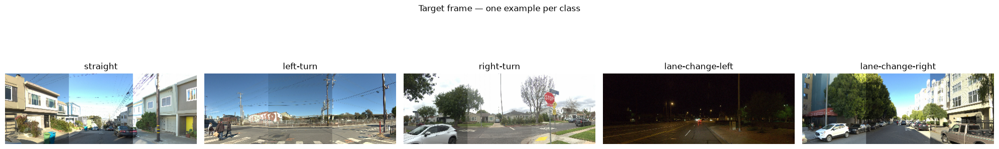

In [6]:
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
import numpy as np
import random
from collections import defaultdict, Counter
from standard_e2e import Modality, TrajectoryComponent

TRAIN_DIR = '/Users/dawson/mids/ds281/281-s2-group2-final/data/processed/waymo_e2e/training/'
files = sorted([f for f in os.listdir(TRAIN_DIR) if f.endswith('.npz')])

MANEUVER_RANK = {
    'left-turn': 5,
    'right-turn': 5,
    'lane-change-left': 4,
    'lane-change-right': 4,
    'straight': 3,
    'stationary': 1,
}

def classify_future_maneuver(xs, ys):
    total_dist = np.sqrt((xs[-1] - xs[0])**2 + (ys[-1] - ys[0])**2)
    if total_dist < 2.0:
        return 'stationary'
    n = len(xs)
    mid = n // 2
    dx1, dy1 = xs[mid] - xs[0], ys[mid] - ys[0]
    dx2, dy2 = xs[-1] - xs[mid], ys[-1] - ys[mid]
    mag1 = np.sqrt(dx1**2 + dy1**2)
    mag2 = np.sqrt(dx2**2 + dy2**2)
    if mag1 < 0.1 or mag2 < 0.1:
        return 'stationary'
    cross = dx1 * dy2 - dy1 * dx2
    dot = dx1 * dx2 + dy1 * dy2
    angle = np.arctan2(cross / (mag1 * mag2), dot / (mag1 * mag2)) * 180 / np.pi
    if dot / (mag1 * mag2) < -0.3:
        return 'left-turn' if ys[-1] > 0 else 'right-turn'
    elif abs(angle) < 8:
        return 'straight'
    elif abs(angle) < 20:
        return 'lane-change-left' if angle > 0 else 'lane-change-right'
    else:
        return 'left-turn' if angle > 0 else 'right-turn'

# group all frames by sequence
sequences = defaultdict(list)
for fname in files:
    seq_id = fname.rsplit('_', 1)[0]
    frame_idx = int(fname.rsplit('_', 1)[1].replace('.npz', ''))
    sequences[seq_id].append((frame_idx, fname))

for seq_id in sequences:
    sequences[seq_id].sort(key=lambda x: x[0])

# sample 200 sequences
random.seed(42)
N_SEQUENCES = 200
sampled_seq_ids = random.sample(list(sequences.keys()), N_SEQUENCES)

manifest = {}
dropped = 0

for seq_id in sampled_seq_ids:
    seq_frames = sequences[seq_id]
    frame_indices = [f[0] for f in seq_frames]
    fname_map = {f[0]: f[1] for f in seq_frames}

    best_fname = None
    best_frame_idx = None
    best_maneuver = None
    best_rank = -1

    for frame_idx, fname in seq_frames:
        data = np.load(os.path.join(TRAIN_DIR, fname), allow_pickle=True)
        modality = data['_modality_data'].item()
        future = modality[Modality.FUTURE_STATES]
        if future.isEmpty:
            continue
        xs = future.get(TrajectoryComponent.X).flatten()
        ys = future.get(TrajectoryComponent.Y).flatten()
        maneuver = classify_future_maneuver(xs, ys)
        rank = MANEUVER_RANK[maneuver]
        if rank > best_rank:
            best_rank = rank
            best_maneuver = maneuver
            best_fname = fname
            best_frame_idx = frame_idx

    if best_fname is None:
        dropped += 1
        continue

    pos = frame_indices.index(best_frame_idx)

    if pos == 0:
        if best_maneuver == 'straight':
            target_fname = best_fname
        else:
            dropped += 1
            continue
    else:
        target_fname = fname_map[frame_indices[pos - 1]]

    manifest[seq_id] = (best_maneuver, target_fname, best_fname)

# label distribution
label_counts = Counter(v[0] for v in manifest.values())
total = sum(label_counts.values())
print(f'Sampled: {N_SEQUENCES}, Labeled: {total}, Dropped: {dropped}')
print('\nSequence-level maneuver distribution:')
for k, v in sorted(label_counts.items(), key=lambda x: -x[1]):
    print(f'  {k}: {v} ({v/total*100:.1f}%)')

# visual grid
import matplotlib.pyplot as plt
classes = ['straight', 'left-turn', 'right-turn', 'lane-change-left', 'lane-change-right']
examples = {}
for seq_id, (label, target_fname, best_fname) in manifest.items():
    if label in classes and label not in examples:
        data = np.load(os.path.join(TRAIN_DIR, target_fname), allow_pickle=True)
        img = data['_modality_data'].item()[Modality.CAMERAS]
        examples[label] = img
    if len(examples) == len(classes):
        break

fig, axes = plt.subplots(1, len(classes), figsize=(20, 4))
for i, cls in enumerate(classes):
    if cls in examples:
        axes[i].imshow(np.array(examples[cls]))
        axes[i].set_title(cls)
    else:
        axes[i].set_title(f'{cls}\n(no example)')
    axes[i].axis('off')
plt.suptitle('Target frame — one example per class')
plt.tight_layout()
plt.savefig('manifest_validation_v2.png', dpi=150)
plt.show()